# Tutorial on Imaging Mass Cytometry data 

In this tutorial we will showcase how ATHENA can be used to explore Imaging Mass Cytometry datasets. We will use the publicly available dataset of (Jackson et al., 2020 - [paper](https://www.nature.com/articles/s41586-019-1876-x)), where the authors used a panel of 35 cancer and immune markers to spatially profile the breast cancer ecosystem using Tissue Microarrays (TMAs) from two cohorts of breast cancer patients. 


## Import needed packages

In [1]:
import athena as ath
import numpy as np
import pandas as pd
from tqdm import tqdm
from matplotlib import cm
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, Normalize
import seaborn as sns

pd.set_option('display.max_columns', 5)

## Load IMC data into a `AnnData` object
Although the dataset consists of a total of 720 tumor images from 352 patients with breast cancer, for this tutorial, we will work with 7 random TMA cores from the _zurich_ cohort that can be easily loaded using the `.dataset` module of `Athena`:

The dataset is a dictionary with sample names as keys and anndata objects as data objects.

Note: Download the latest version of the data set by setting `force_download=True`


In [2]:
# ad = ath.dataset.imc(force_download=True)
data = ath.dataset.imc()
data

{'slide_49_By2x5': AnnData object with n_obs × n_vars = 1541 × 34
     obs: 'core', 'meta_id', 'meta_label', 'cell_type_id', 'cell_type', 'phenograph_cluster', 'CellId', 'id'
     var: 'feature_type', 'metal_tag', 'fullstack_index', 'channel', 'full_target_name'
     uns: 'mask', 'metadata'
     obsp: 'knn', 'radius', 'contact',
 'slide_59_Cy7x7': AnnData object with n_obs × n_vars = 2792 × 34
     obs: 'core', 'meta_id', 'meta_label', 'cell_type_id', 'cell_type', 'phenograph_cluster', 'CellId', 'id'
     var: 'feature_type', 'metal_tag', 'fullstack_index', 'channel', 'full_target_name'
     uns: 'mask', 'metadata'
     obsp: 'knn', 'radius', 'contact',
 'slide_59_Cy7x8': AnnData object with n_obs × n_vars = 2856 × 34
     obs: 'core', 'meta_id', 'meta_label', 'cell_type_id', 'cell_type', 'phenograph_cluster', 'CellId', 'id'
     var: 'feature_type', 'metal_tag', 'fullstack_index', 'channel', 'full_target_name'
     uns: 'mask', 'metadata'
     obsp: 'knn', 'radius', 'contact',
 'slide

## Explore `AnnData` object

Various preprocessing steps (segmentation, single-cell quantification, phenotyping) have been applied to the data by the original authors and are included in the various attributes of the data. For example, `ad.uns['metadata']` contains sample-level metadata:

In [3]:
sample_name = list(data.keys())[0]
ad = data[sample_name]

In [4]:
print(ad.uns['metadata']) #see all available sample annotations

pid                                           49
location                                  CENTER
grade                                          2
tumor_type                       INVASIVE_DUCTAL
tumor_size                                  48.0
gender                                    FEMALE
menopausal                                  POST
PTNM_M                                        M0
age                                           59
Patientstatus                                 []
treatment                                     []
PTNM_T                                        t2
DiseaseStage                                  []
PTNM_N                                        n0
AllSamplesSVSp4.Array                        NaN
TMALocation                                  NaN
TMAxlocation                                 NaN
yLocation                                    NaN
DonorBlocklabel                              NaN
diseasestatus                                NaN
TMABlocklabel       

... and `so.obs` contains all single-cell level metadata:

In [5]:
print(ad.obs.columns) #see all available sample annotations
ad.obs.head(3) 

Index(['core', 'meta_id', 'meta_label', 'cell_type_id', 'cell_type',
       'phenograph_cluster', 'CellId', 'id'],
      dtype='object')


,core,meta_id,...,CellId,id
cell_id,,,,,
1,slide_49_By2x5,11,...,1,ZTMA208_slide_49_By2x5_1
2,slide_49_By2x5,11,...,2,ZTMA208_slide_49_By2x5_2
3,slide_49_By2x5,11,...,3,ZTMA208_slide_49_By2x5_3


The `ad.uns['mask']` attribute stores the segmentation mask. `0` indicates background. The single cell segmentations are indicated by integers starting from `1`. We refer to them as `object_ids` and they are also the indices of the `ad.obs` dataframe (as str dtype). It is important that you keep the same ids, i.e. that the ids in the segmentation mask are the same as the indices in the `ad.obs` dataframe.

(424, 551)


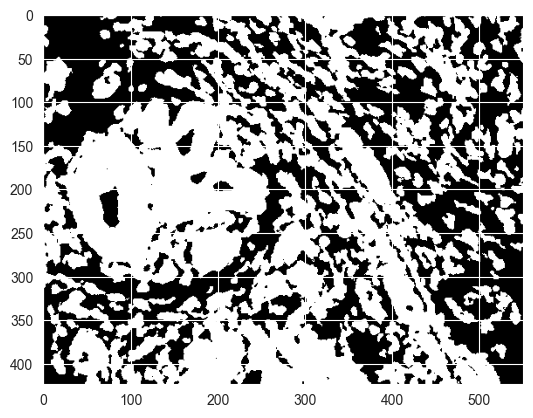

In [6]:
print(ad.uns['mask'].shape)
assert set(ad.uns['mask'].flatten()) - set([0]) == set(ad.obs.index.astype(int))
plt.imshow(ad.uns['mask'] > 0, cmap='gray')


## Visualize single-cell data
One can define colormaps for the features. For categorical feature you can store a mapping of category to color as a dict in `ad.uns['cmaps'][feature]`, a list with colors or a `matplotlib.colormaps`. ATHENA will check the dtype of a column to determine whether it is categorical. If there is no cmap stored we will us `colorcet.glasbey_bw` with 255 different colors. For continuous features you can store a colormap in `ad.uns['cmaps'][feature]`. The default colormap is `cm.Reds`.


### Set colormaps
First, let us set up a colormap and save it in the `.uns` attribute of the `AnnData` instance, where it will be accessed by the `.pl` submodules when plotting certain features of the data. If no colormap is defined, the `.pl` module uses the ```default``` colormap (`ad.uns['colormap']['default']`). The loaded dataset already comes with a phenotype classification for each single cell (`meta_id` in `.obs`) and a more coarse classification into main cell types (`cell_type_id` in `.obs`).

In [7]:
import colorcet

# set up colormaps for meta_id
cmap_meta_label = {
    'Background': (1.0, 1.0, 1.0),
    'B cells': (0.0392156862745098, 0.5529411764705883, 0.25882352941176473),
    'B and T cells': (0.24313725490196078,
                      0.7098039215686275,
                      0.33725490196078434),
    'T cell': (0.7058823529411765, 0.8313725490196079, 0.19607843137254902),
    'Macrophages': (0.09019607843137255, 0.396078431372549, 0.21176470588235294),
    'Endothelial': (0.9725490196078431, 0.9098039215686274, 0.050980392156862744),
    'Vimentin Hi': (0.00392156862745098, 0.9686274509803922, 0.9882352941176471),
    'Small circular': (0.7450980392156863,
                       0.9882352941176471,
                       0.9882352941176471),
    'Small elongated': (0.5882352941176471,
                        0.8235294117647058,
                        0.8823529411764706),
    'Fibronectin Hi': (0.592156862745098, 0.996078431372549, 1.0),
    'Larger elongated': (0.0, 1.0, 0.9803921568627451),
    'SMA Hi Vimentin': (0.6039215686274509,
                        0.9568627450980393,
                        0.9921568627450981),
    'Hypoxic': (0.07450980392156863, 0.2980392156862745, 0.5647058823529412),
    'Apopotic': (0.0, 0.00784313725490196, 0.984313725490196),
    'Proliferative': (0.5764705882352941, 0.8352941176470589, 0.7764705882352941),
    'p53 EGFR': (0.2627450980392157, 0.5490196078431373, 0.4470588235294118),
    'Basal CK': (0.9333333333333333, 0.27450980392156865, 0.2784313725490196),
    'CK7 CK hi Cadherin': (0.3137254901960784,
                           0.17647058823529413,
                           0.5607843137254902),
    'CK7 CK': (0.5294117647058824, 0.2980392156862745, 0.6196078431372549),
    'Epithelial low': (0.9803921568627451,
                       0.7019607843137254,
                       0.7647058823529411),
    'CK low HR low': (0.9647058823529412, 0.4235294117647059, 0.7019607843137254),
    'HR hi CK': (0.8117647058823529, 0.403921568627451, 0.16862745098039217),
    'CK HR': (0.8784313725490196, 0.6352941176470588, 0.00784313725490196),
    'HR low CK': (0.9647058823529412, 0.5137254901960784, 0.43137254901960786),
    'Myoepithalial': (0.5294117647058824,
                      0.3607843137254902,
                      0.16862745098039217),
    'CK low HR hi p53': (0.6980392156862745,
                         0.12941176470588237,
                         0.10980392156862745)}

# cell_type colormap
cmap_cell_type = {
    'background': 'white',
    'immune': 'darkgreen',
    'endothelial': 'gold',
    'stromal': 'steelblue',
    'tumor': 'darkred',
    'myoepithelial': 'coral'
}

for ad in data.values():
    # define default colormap
    ad.uns['cmaps'] = {}
    ad.uns['cmaps'].update({'default': cm.Reds})
    ad.uns['cmaps']['category'] = colorcet.glasbey_bw
    ad.uns['cmaps'].update({'meta_label': cmap_meta_label})
    ad.uns['cmaps'].update({'cell_type': cmap_cell_type})
    ad.uns['cmap_labels'] = {}
    

### Plot protein intensity or single-cell annotations 

The `AnnData` object can be visualised with the plotting function `pl.spatial`.
In a first step we extract the centroids of each cell segmentation masks with `regionprops_table` and store the results in the `AnnData` instance (`ad.obs`). This is required to enable the full plotting functionalities.

In [8]:
from skimage.measure import regionprops_table
import pandas as pd

for spl in data.keys():
    ad = data[spl]
    centroids = pd.DataFrame(regionprops_table(ad.uns['mask'], properties=('label', 'centroid')))
    centroids.columns = ['object_id', 'y', 'x']
    centroids = centroids.set_index('object_id')
    centroids.index = centroids.index.astype(str)  # we need to convert to `str` to match the index of `ad.obs`
    ad.obs = pd.concat((ad.obs, centroids), axis=1)

If only the `AnnData` instance and the sample id is provided, the sample is plotted as a scatter plot using the computed centroids. However, with `mode=mask` and passing the mask with `mask=mask`, the computed segmentation masks are used. The observations can be colored according to a specific feature from `ad.obs` or `ad.X` - see example below.

/var/folders/q9/g71_n8ln7mz8j3y78539t8gw0000gn/T/ipykernel_81136/2965199399.py:9: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


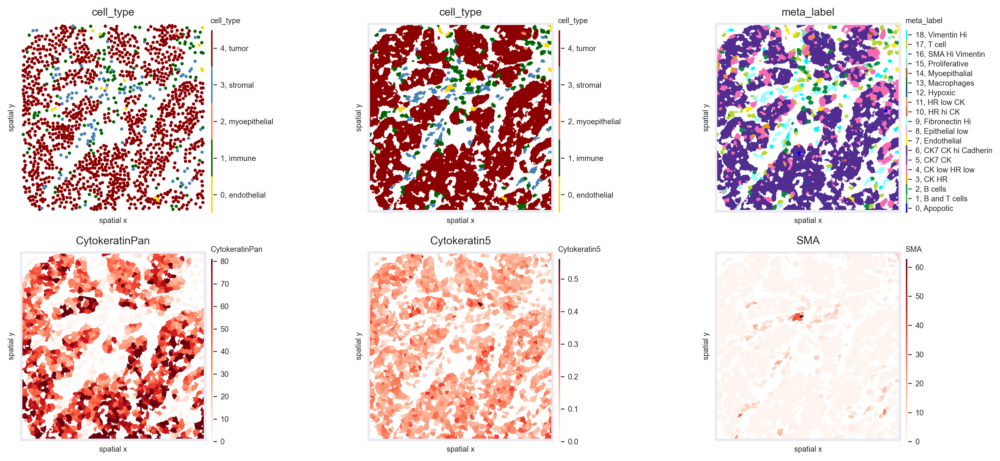

In [9]:
spl = 'slide_7_Cy2x4'
fig, axs = plt.subplots(2, 3, figsize=(15, 6), dpi=300)
ath.pl.spatial(ad=ad, attr='cell_type', ax=axs.flat[0])
ath.pl.spatial(ad=ad, attr='cell_type', mode='mask', ax=axs.flat[1])
ath.pl.spatial(ad=ad, attr='meta_label', mode='mask', ax=axs.flat[2])
ath.pl.spatial(ad=ad, attr='CytokeratinPan', mode='mask', ax=axs.flat[3])
ath.pl.spatial(ad=ad, attr='Cytokeratin5', mode='mask', ax=axs.flat[4])
ath.pl.spatial(ad=ad, attr='SMA', mode='mask', ax=axs.flat[5])
fig.show()

Experiment with different colormaps or background colors:

/var/folders/q9/g71_n8ln7mz8j3y78539t8gw0000gn/T/ipykernel_81136/1236921646.py:9: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


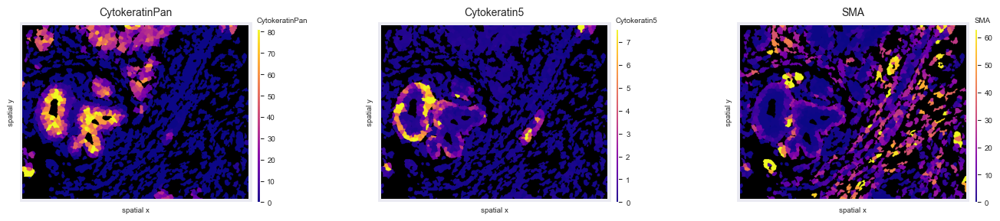

In [10]:
spl = 'slide_49_By2x5'
ad = data[spl]

ad.uns['cmaps'].update({'default': cm.plasma})
fig, axs = plt.subplots(1, 3, figsize=(15, 3), dpi=100)
ath.pl.spatial(ad=ad, attr='CytokeratinPan', mode='mask', ax=axs.flat[0], background_color='black')
ath.pl.spatial(ad=ad, attr='Cytokeratin5', mode='mask', ax=axs.flat[1], background_color='black')
ath.pl.spatial(ad=ad, attr='SMA', mode='mask', ax=axs.flat[2], background_color='black')
fig.show()

## Graph construction
Use the `.graph` submodule to construct 3 different graphs and experiment with the parameters (k, radius). Under the hood we use the sklearn.neighbors implementation. This means you can pass additional arguments to the function according to the sklearn.neighbors documentation.

In [11]:
# import default graph builder parameters
from athena.utils.default_configs import get_default_config

# knn
ath.graph.build_graph(ad, topology='knn', n_neighbors=6, include_self=True)
# pass additional parameters and set `graph_key 
ath.graph.build_graph(ad, topology='knn', graph_key='knn_n10', n_neighbors=10, include_self=True)

# radius
ath.graph.build_graph(ad, topology='radius', radius=36, include_self=True)

# contact, this is a custom implementation
ath.graph.build_graph(ad, topology='contact', include_self=True)

# the results are saved back into the AnnData object:
ad.obsp['knn']

100%|██████████| 1541/1541 [00:15<00:00, 99.44it/s] 


<Compressed Sparse Row sparse array of dtype 'float64'
	with 10509 stored elements and shape (1541, 1541)>

The results can be plotted again using the `.pl.spatial` submodule. Notice how different graph builders result in graphs with different properties:

/var/folders/q9/g71_n8ln7mz8j3y78539t8gw0000gn/T/ipykernel_81136/1918892349.py:5: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


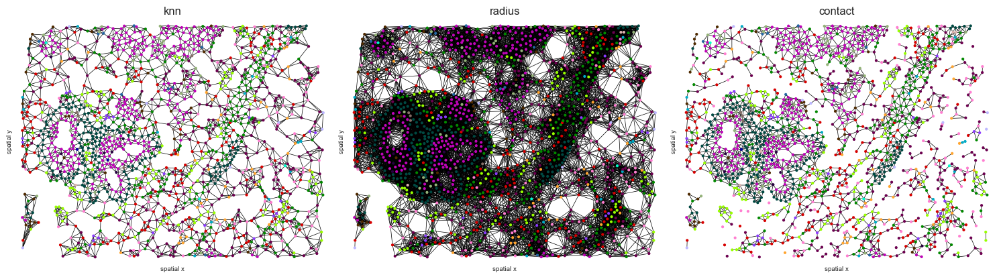

In [12]:
fig, axs = plt.subplots(1, 3, figsize=(15, 6), dpi=100)
for topology, ax in zip(['knn', 'radius', 'contact'], axs):
    ath.pl.spatial(ad=ad, attr='meta_id', edges=True, graph_key=topology, ax=ax, cbar=False)
    ax.set_title(topology)
fig.show()

## Heterogeneity quantification

### Sample-level scores
Sample-level scores estimate a single heterogeneity score for the whole tumor, saved in `so.spl`. Although they ignore the spatial topology and cell-cell interactions, they describe the heterogeneity attrbuted to the number of cell types present and their frequencies. Below we show how to compute some of the included metrics across all 8 samples:

In [13]:
# compute cell counts
ad.uns['metadata']['cell_count']=len(ad.obs)
ad.uns['metadata']['immune_cell_count']=(ad.obs.cell_type == 'immune').sum()

# compute metrics at a sample level
for spl in data.keys():
    ad = data[spl]
    ath.metrics.richness(ad=ad, attr='meta_label', local=False)
    ath.metrics.shannon(ad=ad, attr='meta_label', local=False)

# estimated values are saved in ad.uns
sample_level_scores = pd.DataFrame()
for spl in data.keys():
    ad = data[spl]
    df = pd.DataFrame(
        {'richness_meta_label': ad.uns['richness_meta_label'],
         'shannon_meta_label': ad.uns['shannon_meta_label']}, index=[spl])
    sample_level_scores = pd.concat((sample_level_scores, df))
sample_level_scores

,richness_meta_label,shannon_meta_label
slide_49_By2x5,19,3.333942
slide_59_Cy7x7,13,2.155000
slide_59_Cy7x8,15,1.899001
slide_59_Cy8x1,14,2.305581
slide_7_Cy2x2,15,3.113132
slide_7_Cy2x3,13,2.821626
slide_7_Cy2x4,19,1.814858


To evaluate results, let's look at two samples (`slide_7_Cy2x2` and `slide_7_Cy2x4`). Although they have similar richness, their Shannon entropy values are markedly different, indicating higher heterogeneity for sample `slide_7_Cy2x2`:

/var/folders/q9/g71_n8ln7mz8j3y78539t8gw0000gn/T/ipykernel_81136/4233343775.py:4: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


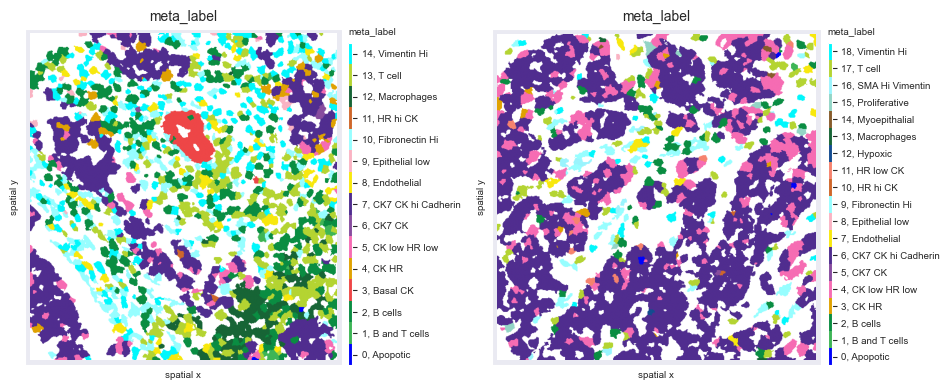

In [14]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4), dpi=100)
ath.pl.spatial(ad=data['slide_7_Cy2x2'], attr='meta_label', mode='mask', ax=axs.flat[0])
ath.pl.spatial(ad=data['slide_7_Cy2x4'], attr='meta_label', mode='mask', ax=axs.flat[1])
fig.show()

Indeed, we clearly see that while the first sample is dominated by one cell subpopulation (`CK7 CK hi Cadherin`), in the second sample the `meta_id` distribution is more spread, resulting in a higher Shannon index.

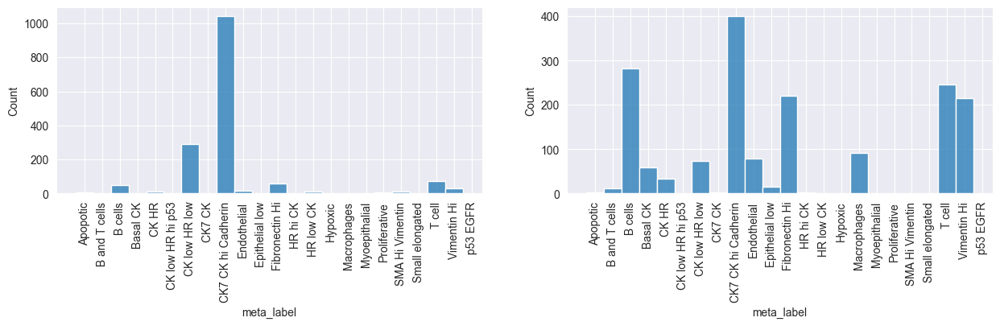

In [15]:
import seaborn as sns
fig = plt.figure(figsize=(15, 3))
plt.subplot(1, 2, 1)
sns.histplot(data['slide_7_Cy2x4'].obs['meta_label'])
plt.xticks(rotation=90)
plt.subplot(1, 2, 2)
sns.histplot(data['slide_7_Cy2x2'].obs['meta_label'])
plt.xticks(rotation=90)
plt.show()

### Cell-level scores
Cell-level scores quantify heterogeneity in a spatial manner, accounting for local effects, and return a value per single cell, saved in `ad.obs`. To apply these scores to the data we use again `.metrics` but this time with `local=True`.  Since these scores heavily depend on the tumor topology, the graph type and occasionally additional parameters also need to be provided.

In [16]:
from tqdm import tqdm
# compute metrics at a cell level for all samples - this will take some time
for spl in tqdm(data.keys()):
    ath.metrics.richness(ad=data[spl], attr='meta_label', local=True, graph_key='contact')
    ath.metrics.shannon( ad=data[spl], attr='meta_label', local=True, graph_key='contact')
    ath.metrics.quadratic_entropy(ad=data[spl], attr='meta_label', local=True, graph_key='contact', metric='cosine')

# estimated values are saved in so.obs
ad.obs.columns

100%|██████████| 7/7 [00:09<00:00,  1.38s/it]


Index(['core', 'meta_id', 'meta_label', 'cell_type_id', 'cell_type',
       'phenograph_cluster', 'CellId', 'id', 'y', 'x',
       'richness_meta_label_contact', 'shannon_meta_label_contact',
       'quadratic_meta_label_contact'],
      dtype='object')

The results can be plotted again using the `.pl.spatial` submodule and passing the attribute we want to visualize. For example, let's observe the spatial heterogeneity of a random sample using three different metrics in the cell below. While local richness highlights tumor neighborhoods with multiple cell phenotypes present, local Shannon  also takes into consideration the proportions of these phenotypes. Finally, local quadratic entropy additionally takes into consideration the similarity between these phenotypes using the single-cell proteomic data stored in `.X`. Notice how, in the last subplot, only regions where cell phenotypes with very different profiles (e.g., tumor - immune - stromal) are highlighted.

/var/folders/q9/g71_n8ln7mz8j3y78539t8gw0000gn/T/ipykernel_81136/2111750948.py:15: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


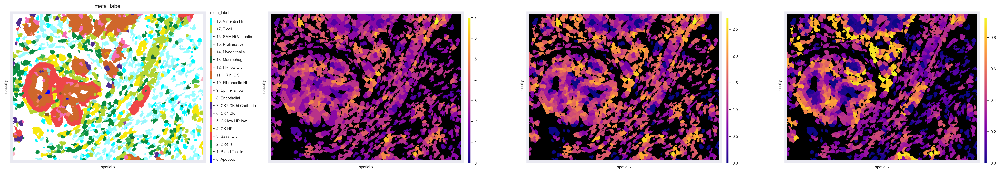

In [17]:
# visualize cell-level scores
spl = 'slide_49_By2x5'
ad = data[spl]

ad.uns['cmaps'].update({'default': cm.plasma})
fig, axs = plt.subplots(1, 4, figsize=(25, 12), dpi=300)
axs = axs.flat
ath.pl.spatial(ad=ad, attr='meta_label', mode='mask', ax=axs[0], title=spl)
ath.pl.spatial(ad=ad, attr='richness_meta_label_contact', mode='mask', ax=axs[1], cbar_title=False,
               background_color='black', title=spl)
ath.pl.spatial(ad=ad, attr='shannon_meta_label_contact', mode='mask', ax=axs[2], cbar_title=False,
               background_color='black', title=spl)
ath.pl.spatial(ad=ad, attr='quadratic_meta_label_contact', mode='mask', ax=axs[3], cbar_title=False,
               background_color='black', title=spl)
fig.show()

We can also observe how different graph topologies strongly influence the results:

/var/folders/q9/g71_n8ln7mz8j3y78539t8gw0000gn/T/ipykernel_81136/294365770.py:17: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


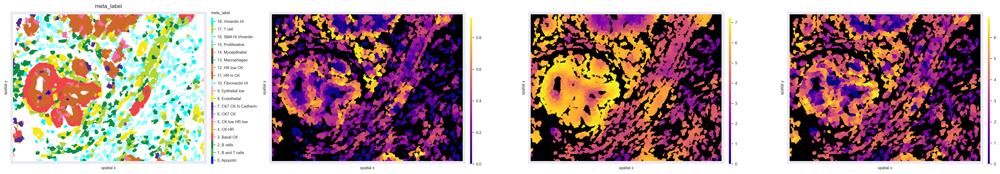

In [18]:
spl = 'slide_49_By2x5'
ad = data[spl]
ad.uns['cmaps'].update({'default': cm.plasma})

# try out different graph topologies
ath.metrics.quadratic_entropy(ad=ad, attr='meta_label', local=True, graph_key='contact', metric='cosine')
ath.metrics.quadratic_entropy(ad=ad, attr='meta_label', local=True, graph_key='radius')
ath.metrics.quadratic_entropy(ad=ad, attr='meta_label', local=True, graph_key='knn')

# visualize results
fig, axs = plt.subplots(1, 4, figsize=(25, 12), dpi=300)
axs = axs.flat
ath.pl.spatial(ad=ad, attr='meta_label', mode='mask', ax=axs[0])
ath.pl.spatial(ad=ad, attr='quadratic_meta_label_contact', mode='mask', ax=axs[1], cbar_title=False, background_color='black')
ath.pl.spatial(ad=ad, attr='quadratic_meta_label_radius', mode='mask', ax=axs[2], cbar_title=False, background_color='black')
ath.pl.spatial(ad=ad, attr='quadratic_meta_label_knn', mode='mask', ax=axs[3], cbar_title=False, background_color='black')
fig.show()

Since these scores are computed at the single-cell level, each tumor can now be represented by a *histogram* of values, as seen below for local quadratic entropy:

/var/folders/q9/g71_n8ln7mz8j3y78539t8gw0000gn/T/ipykernel_81136/3324511559.py:9: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


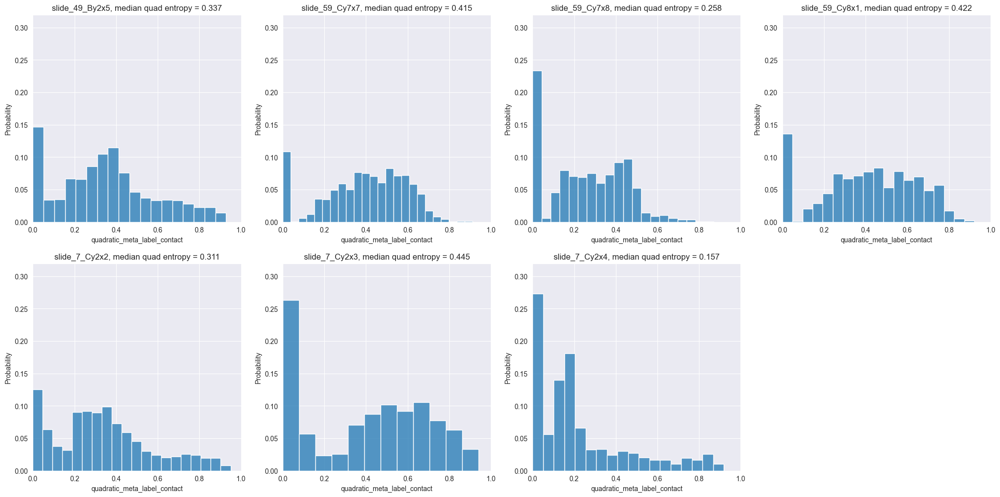

In [19]:
import seaborn as sns
fig = plt.figure(figsize=(25, 12))
for i, spl in enumerate(data.keys()):
    plt.subplot(2, 4, i+1)
    g=sns.histplot(data[spl].obs['quadratic_meta_label_contact'], stat='probability')
    g.set_title(spl + ', median quad entropy = ' + str(round(data[spl].obs['quadratic_meta_label_contact'].median(),3)))
    plt.ylim([0,0.32])
    plt.xlim([0,1])
fig.show()

Let's plot two of the samples with the smallest and highest median quadratic entropy to evaluate the results. We clearly see that `slide_7_Cy2x4` is mostly homogeneous, with few highly entropic regions, and `slide_59_Cy7x7` is highly heterogeneous, as most areas contain mixtures of immune, stromal, endothelial and cancer cells. 

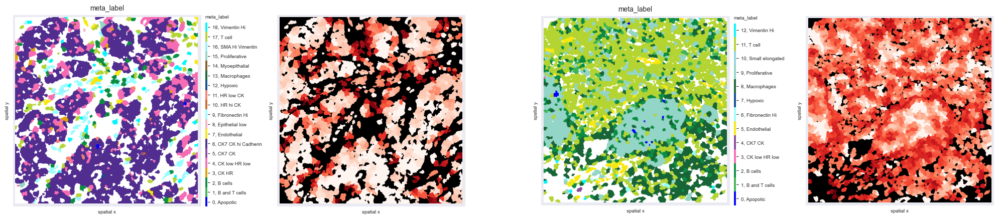

In [20]:
fig, axs = plt.subplots(1, 4, figsize=(20, 8), dpi=100)
ath.pl.spatial(ad=data['slide_7_Cy2x4'], attr='meta_label', mode='mask', ax=axs.flat[0])
ath.pl.spatial(ad=data['slide_7_Cy2x4'], attr='quadratic_meta_label_contact', mode='mask', ax=axs.flat[1], cbar=False,
               background_color='black')
ath.pl.spatial(ad=data['slide_59_Cy7x7'], attr='meta_label', mode='mask', ax=axs.flat[2])
ath.pl.spatial(ad=data['slide_59_Cy7x7'], attr='quadratic_meta_label_contact', mode='mask', ax=axs.flat[3], cbar=False,
               background_color='black')


In [21]:
# if needed, we can retrieve selected single-cell score values 
data[spl].obs.loc[:, ['richness_meta_label_contact',
                      'shannon_meta_label_contact',
                      'quadratic_meta_label_contact']].head(5)

,richness_meta_label_contact,shannon_meta_label_contact,quadratic_meta_label_contact
1,1,-0.0,0.0
2,1,-0.0,0.0
3,1,-0.0,0.0
4,1,-0.0,0.0
5,1,-0.0,0.0


### Immune infiltration
The infiltration score included in the `.neigh` submodule quantifies the degree of tumor-immune mixing (as defined in Keren, L. et al. - [paper](https://www.cell.com/cell/fulltext/S0092-8674(18)31100-0?_returnURL=https%3A%2F%2Flinkinghub.elsevier.com%2Fretrieve%2Fpii%2FS0092867418311000%3Fshowall%3Dtrue)).

For this we need to indicate what labels we want to use and what interactions we want to compare. The interaction score will be a simple ratio of $$\frac{interaction1}{interaction2}$$ interactions.

Let us compute it across all patients:

In [22]:
infiltration = pd.DataFrame()
for spl in tqdm(data.keys()):
    ath.neigh.infiltration(ad=data[spl], attr='cell_type',
                           interaction1=('tumor', 'immune'), interaction2=('immune', 'immune'),
                           graph_key='contact')
    val = data[spl].uns['infiltration']
    pid = data[spl].uns['metadata']['pid']
    infiltration.loc[spl, 'infiltration'] = val
    infiltration.loc[spl, 'pid'] = int(pid)

infiltration

100%|██████████| 7/7 [00:00<00:00, 42.36it/s]


,infiltration,pid
slide_49_By2x5,0.144172,49.0
slide_59_Cy7x7,0.128205,59.0
slide_59_Cy7x8,0.195796,59.0
slide_59_Cy8x1,0.182798,59.0
slide_7_Cy2x2,0.067273,7.0
slide_7_Cy2x3,0.106984,7.0
slide_7_Cy2x4,0.611321,7.0


Now let's sort all samples by increasing immune infiltration:

/var/folders/q9/g71_n8ln7mz8j3y78539t8gw0000gn/T/ipykernel_81136/3136359668.py:9: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


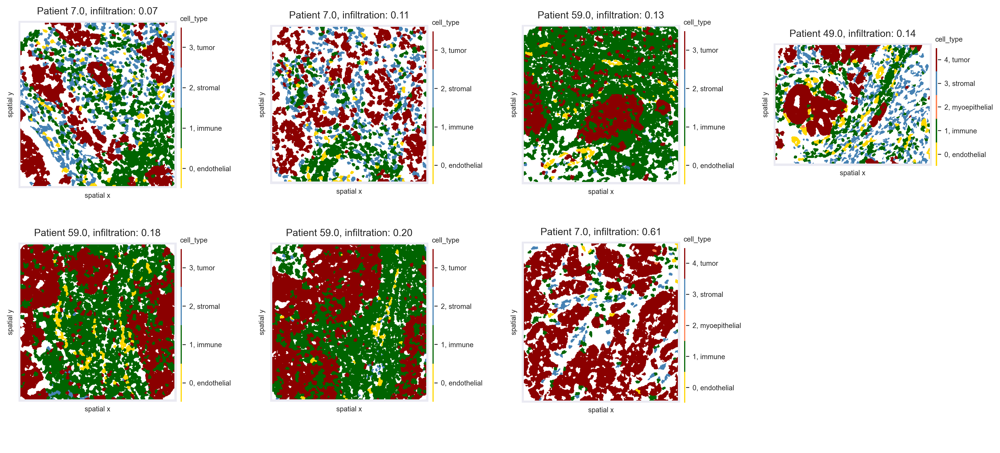

In [23]:
infiltration = infiltration.sort_values('infiltration', ascending=True)

fig, axs = plt.subplots(2, 4, figsize=(14, 7), dpi=300)
for i, spl in enumerate(infiltration.index):
    ath.pl.spatial(ad=data[spl], attr='cell_type', mode='mask', ax=axs.flat[i])
    d = infiltration.loc[spl]
    axs.flat[i].set_title(f'Patient {d.pid}, infiltration: {d.infiltration:.2f}', fontdict={'size': 10})
axs.flat[-1].set_axis_off()
fig.show()

We observe that, as expected, as infiltration increases, immune cells penetrate more into the tumor area. One notable exception is the sample from Patient 7 with the highest infiltration score (0.55). Notice how, in this sample, the number of immune cells is much lower than that of tumor cells, resulting in multiple immune-tumor interactions by chance alone. Since the infiltration score is computed as the ratio of the number of tumor-immune interactions to immune-immune interactions, this high imbalance artificially inflates the infiltration score. 

In a next step we compute the infiltration on a cell-level. Since this method extracts the neighborhood subgraph of each cell it is recommended to use the `radius` graph representation with a reasonable radius.

In [24]:
spl = 'slide_49_By2x5'
ath.graph.build_graph(data[spl], topology='radius', radius=36, include_self=True)

attr = 'cell_type'
ath.neigh.infiltration(ad=data[spl], attr=attr, graph_key='radius', local=True)

100%|██████████| 1541/1541 [00:03<00:00, 509.17it/s]


/var/folders/q9/g71_n8ln7mz8j3y78539t8gw0000gn/T/ipykernel_81136/3490961107.py:5: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


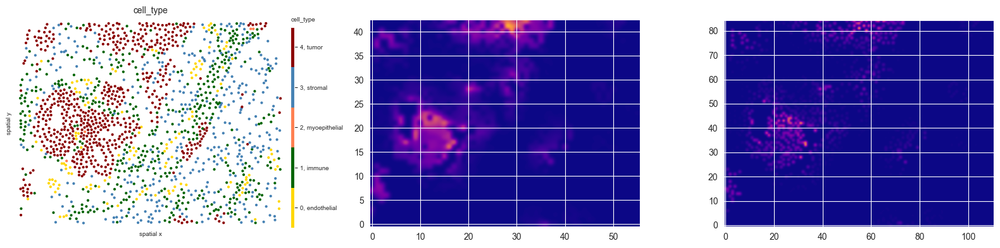

In [25]:
fig, axs = plt.subplots(1, 3, figsize=(16, 8))
ath.pl.spatial(ad=data[spl], attr='cell_type', ax=axs[0])
ath.pl.infiltration(ad=data[spl], step_size=10, ax=axs[1])
ath.pl.infiltration(ad=data[spl], step_size=5, ax=axs[2])
fig.show()

### Cell type interactions
We will then quantify tumor heterogeneity by looking into interactions between cell (pheno)types. First, let's compute the interaction strength using both the `meta_ids` and the `cell_type_ids` across all 8 samples using the `.neigh.interactions` submodule:

In [26]:
import logging

logging.getLogger().setLevel(logging.ERROR)  # set logger to logging.INFO if you want to see more progress information

for spl in ['slide_7_Cy2x4', 'slide_7_Cy2x2']:
    ath.neigh.interactions(ad=data[spl], attr='meta_label', mode='proportion', prediction_type='diff',
                           graph_key='contact')
    ath.neigh.interactions(ad=data[spl], attr='cell_type', mode='proportion', prediction_type='diff',
                           graph_key='contact')

Fri Dec 13 16:50:13 2024: 10/100, duration: 0.01) sec
Fri Dec 13 16:50:13 2024: 20/100, duration: 0.02) sec
Fri Dec 13 16:50:13 2024: 30/100, duration: 0.02) sec
Fri Dec 13 16:50:13 2024: 40/100, duration: 0.02) sec
Fri Dec 13 16:50:13 2024: 50/100, duration: 0.02) sec
Fri Dec 13 16:50:14 2024: 60/100, duration: 0.02) sec
Fri Dec 13 16:50:14 2024: 70/100, duration: 0.02) sec
Fri Dec 13 16:50:14 2024: 80/100, duration: 0.02) sec
Fri Dec 13 16:50:14 2024: 90/100, duration: 0.02) sec
Fri Dec 13 16:50:14 2024: 100/100, duration: 0.02) sec
Fri Dec 13 16:50:14 2024: Finished, duration: 0.03 min (0.02sec/it)
Fri Dec 13 16:50:14 2024: 10/100, duration: 0.01) sec
Fri Dec 13 16:50:14 2024: 20/100, duration: 0.01) sec
Fri Dec 13 16:50:14 2024: 30/100, duration: 0.01) sec
Fri Dec 13 16:50:15 2024: 40/100, duration: 0.01) sec
Fri Dec 13 16:50:15 2024: 50/100, duration: 0.01) sec
Fri Dec 13 16:50:15 2024: 60/100, duration: 0.01) sec
Fri Dec 13 16:50:15 2024: 70/100, duration: 0.01) sec
Fri Dec 13 16

Let's look at the results for sample `slide_7_Cy2x4` below. We notice multiple interactions between the few immune, stromal and endothelial cells (red squares in the first 13 rows and columns). At the same time, most of these cell phenotypes strongly avoid the dominant tumor cell population `19`, indicated by the blue squares in its respective column.

/var/folders/q9/g71_n8ln7mz8j3y78539t8gw0000gn/T/ipykernel_81136/408586024.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


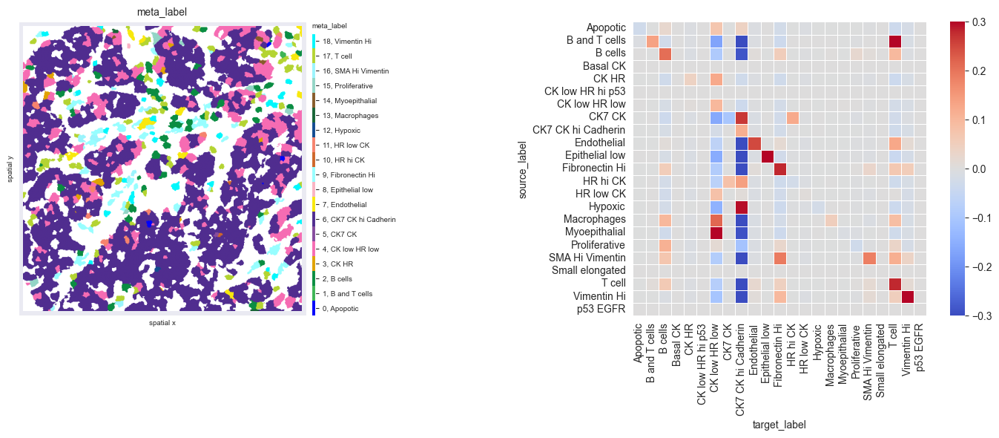

In [27]:
from matplotlib.colors import Normalize

norm = Normalize(-.3, .3)
fig, axs = plt.subplots(1, 2, figsize=(15, 6), dpi=100)
ath.pl.spatial(ad=data['slide_7_Cy2x4'], attr='meta_label', mode='mask', ax=axs[0])
ath.pl.interactions(ad=data['slide_7_Cy2x4'], attr='meta_label', mode='proportion',
                    prediction_type='diff', graph_key='contact',
                    ax=axs[1], norm=norm)
fig.tight_layout()
fig.show()

Observing sample `slide_7_Cy2x2` from the same patient `7` shows again the same immune, endothelial and stromal co-occurence, but this time we notice strongly self-clustered tumor phenotypes (`18`).

/var/folders/q9/g71_n8ln7mz8j3y78539t8gw0000gn/T/ipykernel_81136/2364188436.py:7: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


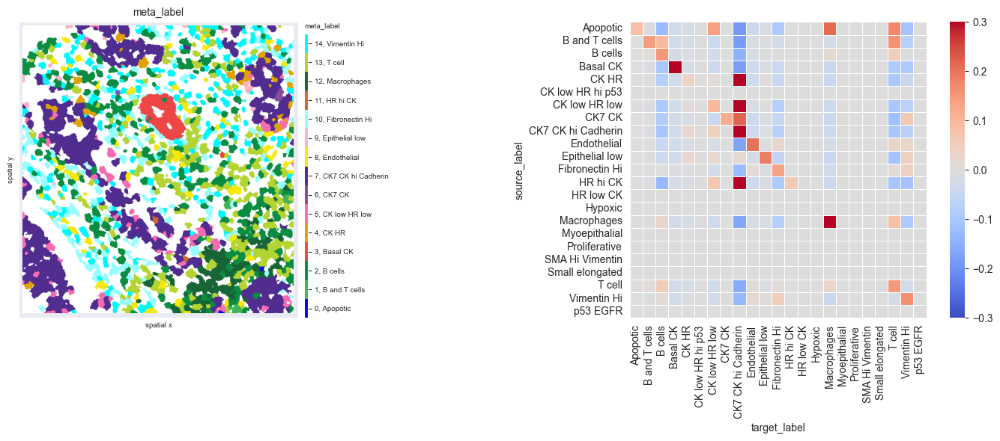

In [28]:
fig, axs = plt.subplots(1, 2, figsize=(15, 6), dpi=100)
ath.pl.spatial(ad=data['slide_7_Cy2x2'], attr='meta_label', mode='mask', ax=axs[0])
ath.pl.interactions(ad=data['slide_7_Cy2x2'], attr='meta_label',
                    mode='proportion', prediction_type='diff', graph_key='contact', ax=axs[1], norm=norm)

fig.tight_layout()
fig.show()

Last, these interaction matrices can also be visualized per `cell_type`, as shown below, where we clearly see again how all immune, stromal and endothelial cells of sample `slide_7_Cy2x4` strongly avoid all tumor cells.

Fri Dec 13 16:50:19 2024: 10/100, duration: 0.01) sec
Fri Dec 13 16:50:19 2024: 20/100, duration: 0.01) sec
Fri Dec 13 16:50:20 2024: 30/100, duration: 0.01) sec
Fri Dec 13 16:50:20 2024: 40/100, duration: 0.01) sec
Fri Dec 13 16:50:20 2024: 50/100, duration: 0.01) sec
Fri Dec 13 16:50:20 2024: 60/100, duration: 0.01) sec
Fri Dec 13 16:50:20 2024: 70/100, duration: 0.01) sec
Fri Dec 13 16:50:20 2024: 80/100, duration: 0.01) sec
Fri Dec 13 16:50:20 2024: 90/100, duration: 0.01) sec
Fri Dec 13 16:50:20 2024: 100/100, duration: 0.01) sec
Fri Dec 13 16:50:20 2024: Finished, duration: 0.02 min (0.01sec/it)


/var/folders/q9/g71_n8ln7mz8j3y78539t8gw0000gn/T/ipykernel_81136/1323638842.py:8: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


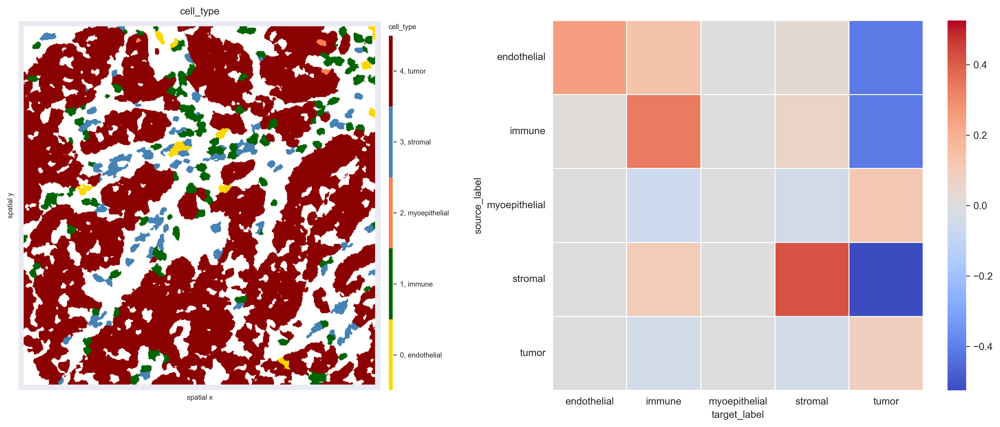

In [29]:
fig, axs = plt.subplots(1, 2, figsize=(15, 6), dpi=300)
ath.pl.spatial(ad=data['slide_7_Cy2x4'], attr='cell_type', mode='mask', ax=axs[0])
norm = Normalize(-.3, .3)
ath.neigh.interactions(ad=data['slide_7_Cy2x4'], attr='cell_type', mode='proportion', prediction_type='diff', graph_key='contact')
ath.pl.interactions(ad=data['slide_7_Cy2x4'], attr='cell_type', mode='proportion', prediction_type='diff', graph_key='contact', ax=axs[1])

fig.tight_layout()
fig.show()

### Ripley's K
Ripley’s $K(t)$ function is used to analyse spatial point processes, i.e., if observed events are regularly dis- tributed in space. The computational framework implements this metric to give insight in whether a certain cell type clusters at different spatial scales or not. Often it is usefull to look at the variance stabilising transform $L(t)$ which is expected to be equal to $t$ under a homogeneous Poisson process.

In a frist step we need to compute the width, height and area of the samples because this is used to determine the different radii at which Ripley's K is computed as well as for edge-corrections of the values.

In [30]:
for spl in data.keys():
    height = data[spl].uns['mask'].shape[0]
    width = data[spl].uns['mask'].shape[1]
    area = width * height
    data[spl].uns['area'] = area
    data[spl].uns['height'] = height
    data[spl].uns['width'] = width

In [31]:
# compute estimated deviation from random poisson process L(t)-t 
import numpy as np

spl = 'slide_7_Cy2x2'
spl = 'slide_49_By2x5'
attr = 'meta_label'
radii = np.linspace(0, 400, 100)
ids = data[spl].obs[attr].unique().tolist()
for _id in ids:
    ath.neigh.ripleysK(data[spl], attr=attr, id=_id, mode='csr-deviation', radii=radii)

/Users/adrianomartinelli/projects/ai4scr/ATHENA/athena/plotting/visualization.py:347: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/var/folders/q9/g71_n8ln7mz8j3y78539t8gw0000gn/T/ipykernel_81136/1158674314.py:5: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


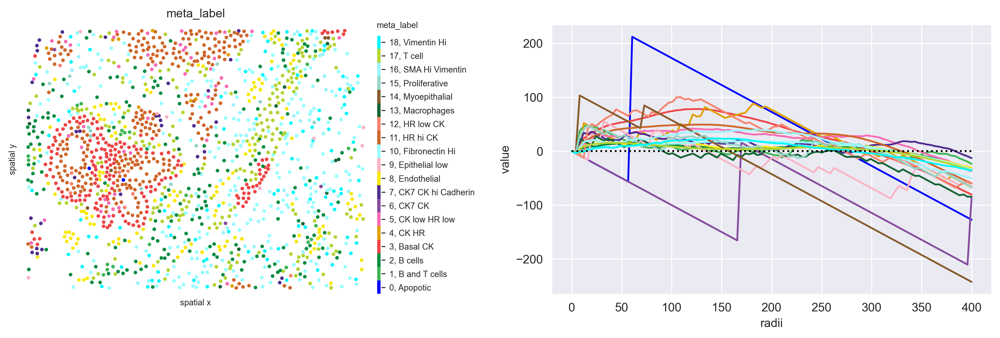

In [32]:
# plot estimated deviation from random poisson process L(t)-t
fig, axs = plt.subplots(1, 2, figsize=(12, 4), dpi=300)
ath.pl.spatial(ad=data[spl], attr=attr, ax=axs[0])
ath.pl.ripleysK(ad=data[spl], attr=attr, ids=ids, mode='csr-deviation', ax=axs[1], legend=False)
fig.show()

In the plot above we can see how all cell types except `15` and `20` cluster on smaller distances (radii in pixel). Spatial cluster analysis scores quantify the degree of spatial clustering or dispersion of different phenotypes as a function of distance, revealing a strong clustering of Apoptotic cells at a short distance (high deviation from 0 for the $L(t)-t$), clustering of Basal CK and Myoepithelial cells at medium distance and dispersion at higher distance, and random distribution of immune and stromal cells ($L(t)-t$ close to 0).